In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# ! pip uninstall numba -y && pip install numba

In [4]:
import os
import sys

# Получаем абсолютный путь к корневой директории проекта (директория выше текущей)
root_path = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Добавляем корневую директорию в sys.path
if root_path not in sys.path:
    sys.path.append(root_path)

In [5]:
from model_loaders import load_ss_model
import weightwatcher as ww
from matplotlib import pyplot as plt
from pipeline import separate_audio
import torch
from utils import parse_yaml
from models.clap_encoder import CLAP_Encoder
import IPython.display as ipd
from models.audiosep_lora import AudioSepLora

2024-03-14 21:05:26.669957: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-14 21:05:26.669987: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-14 21:05:26.670729: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-14 21:05:26.674672: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-14 21:05:27.196074: W tensorflow/compiler/tf2

In [6]:
SS_CONFIG_PATH = '../config/audiosep_base.yaml'
CLAP_CKPT_PATH = '../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt'
AUDIOSEP_CKPT_PATH = '../checkpoint/audiosep_base_4M_steps.ckpt'

In [7]:
device = torch.device('cuda')
configs = parse_yaml(SS_CONFIG_PATH)

In [9]:
def describe_weights(model):
    watcher = ww.WeightWatcher()
    details = watcher.analyze(model=model)
    summary = watcher.get_summary(details)

    return details, summary

def plot_hist(details):
    avg_alpha = details.alpha.mean()

    title=f"WeightWatcher Alpha"
    details.alpha.plot.hist(bins=100)
    plt.title(title)
    plt.axvline(x=avg_alpha, color='green',label=f"<alpha> = {avg_alpha:0.3f}")
    plt.legend()

In [10]:
audio_file = '../audios/test.wav'
text = 'vocal'
output_file = '../separation_result/test.wav'

In [11]:
from models.audiosep_tunned_embeddings import AudioSepTunedEmbeddings

query_encoder_for_lora = CLAP_Encoder(pretrained_path = CLAP_CKPT_PATH).eval().to(device)
base_model_for_lora = load_ss_model(configs=configs, checkpoint_path=AUDIOSEP_CKPT_PATH, query_encoder=query_encoder_for_lora).eval().to(device)

model = AudioSepTunedEmbeddings.load_from_checkpoint(
    checkpoint_path='../checkpoints/train_audiosep_tuned_embeddings/audiosep_tuned_embeddings_musdb18,devices=1/epoch=29.ckpt',
    strict=False,
    ss_model=base_model_for_lora.ss_model,
    query_encoder=base_model_for_lora.query_encoder,
    waveform_mixer=None,
    loss_function=None,
    optimizer_type=None,
    learning_rate=None,
    lr_lambda_func=None,
) \
    .eval() \
    .to(device)


2024-03-14 21:05:37,500 - INFO - Loading HTSAT-base model config.
2024-03-14 21:05:39,504 - INFO - Loading pretrained HTSAT-base-roberta weights (../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt).


In [12]:
output_file2 = '../separation_result/test2.wav'

# AudioSep processes the audio at 32 kHz sampling rate
separate_audio(model, audio_file, text, output_file2, device, use_chunk=True)

Separating audio from [../audios/test.wav] with textual query: [vocal]
Separated audio written to [../separation_result/test2.wav]


In [13]:
ipd.Audio('../separation_result/test2.wav') # load a local WAV file

In [22]:
# хорошо отделяется только вокал. И то хуже чем у лоры.

{'log_norm': 2.2757745949684596, 'alpha': 3.9017056086733994, 'alpha_weighted': 3.4012217963430658, 'log_alpha_norm': 3.544637680794859, 'log_spectral_norm': 0.8810221568661143, 'stable_rank': 25.82670350172424}


,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,1,Linear,0.103003,512,512,1.0,4.157688,3.073958,0.937500,True,...,0.344532,5.487104,32.976960,success,2.342457,0.000397,,1,5.487104,0.715633
1,3,Linear,0.091862,512,512,1.0,3.645723,3.728485,0.916011,True,...,0.274349,10.536615,18.676447,success,3.246015,0.001925,,0,10.536615,0.683854


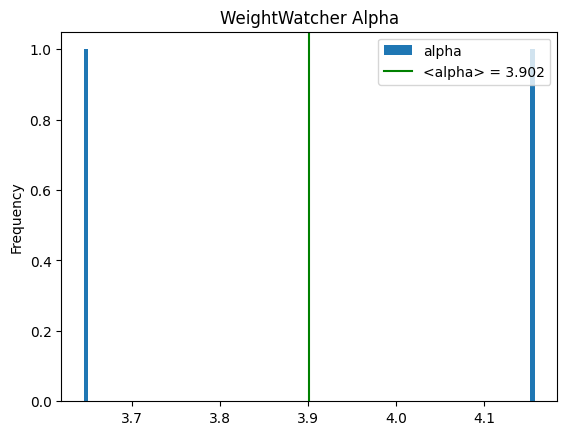

In [15]:
details, summary = describe_weights(model.embedding_layer)
plot_hist(details)
print(summary)
details

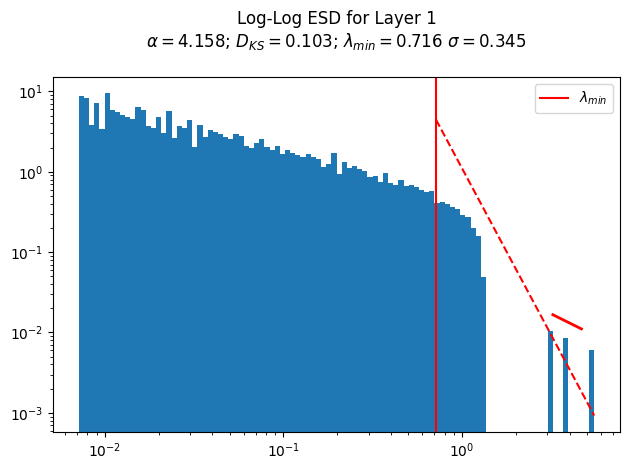

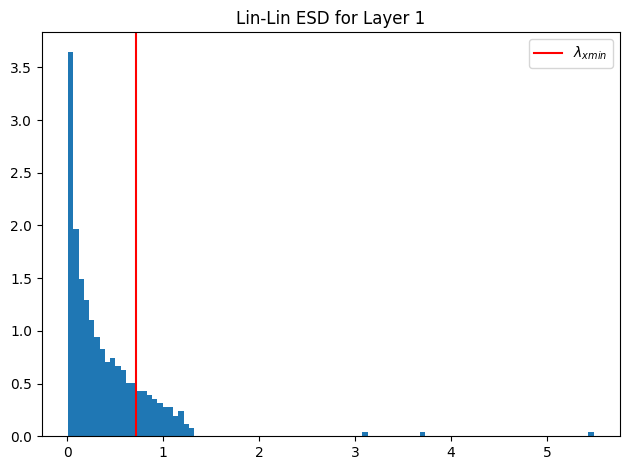

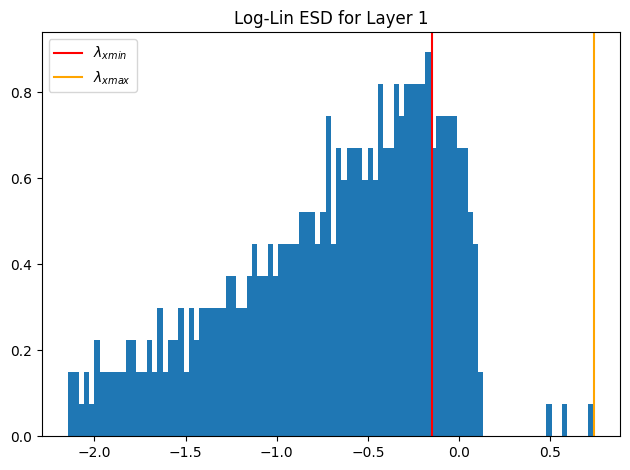

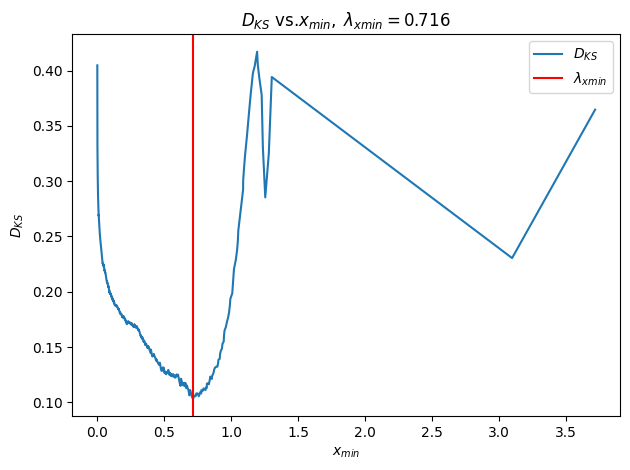

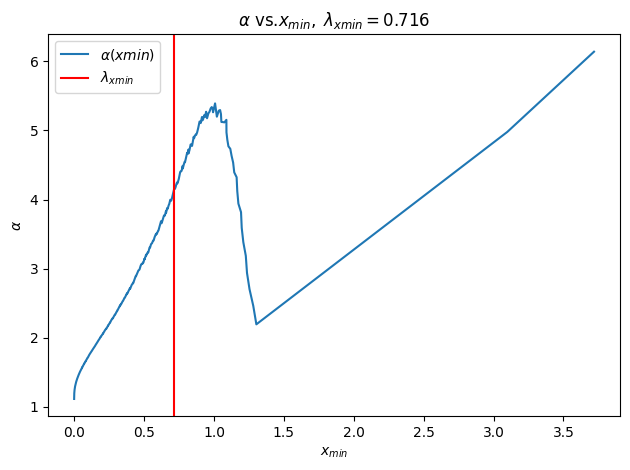

...

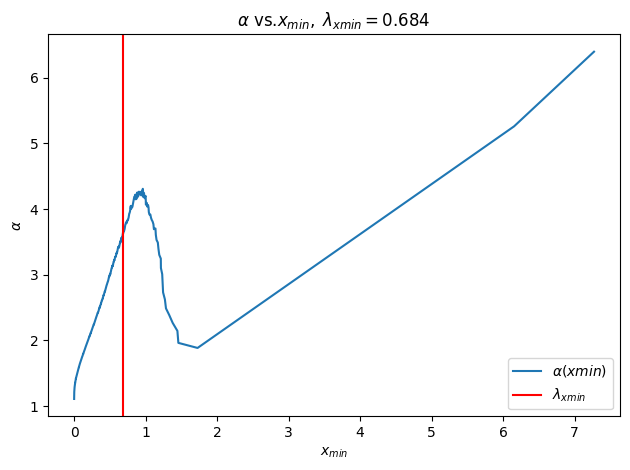

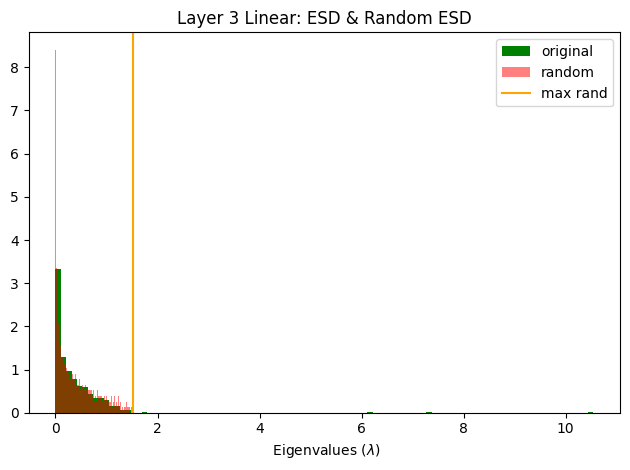

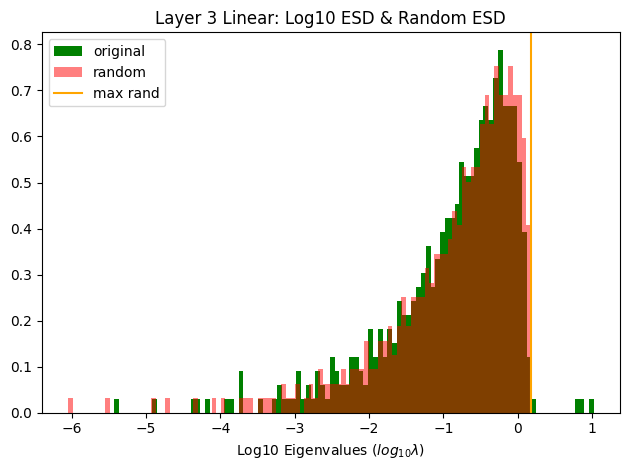

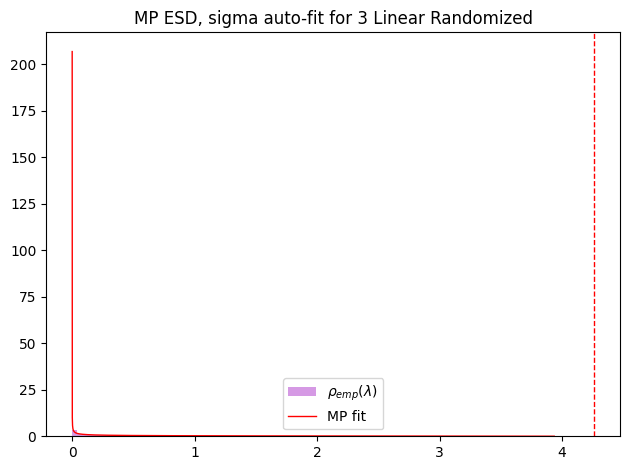

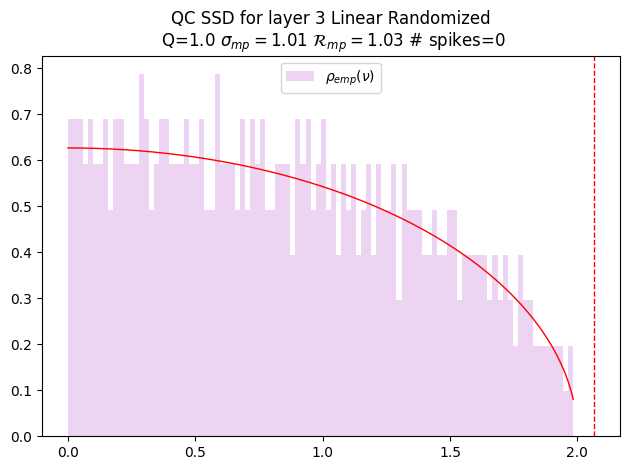

<Figure size 640x480 with 0 Axes>

In [17]:
watcher = ww.WeightWatcher()
details = watcher.analyze(model.embedding_layer, plot=True, randomize=True)